In [34]:
# Import the libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import ydata_profiling
from wordcloud import WordCloud
from nltk.corpus import stopwords
import matplotlib.pylab as pl
import matplotlib.gridspec as gridspec



In [35]:
# Correct file path
file_path = '/content/AccidentesAviones.csv'

# Load the CSV file into a DataFrame
df = pd.read_csv(file_path)

# Display the first few rows of the DataFrame
print(df.head())


   Unnamed: 0               fecha HORA declarada  \
0           0  September 17, 1908           1718   
1           1  September 07, 1909              ?   
2           2       July 12, 1912           0630   
3           3     August 06, 1913              ?   
4           4  September 09, 1913           1830   

                                 Ruta                OperadOR flight_no  \
0                 Fort Myer, Virginia    Military - U.S. Army         ?   
1             Juvisy-sur-Orge, France                       ?         ?   
2           Atlantic City, New Jersey    Military - U.S. Navy         ?   
3  Victoria, British Columbia, Canada                 Private         ?   
4                  Over the North Sea  Military - German Navy         ?   

           route                 ac_type registration cn_ln all_aboard  \
0  Demonstration        Wright Flyer III            ?     1          2   
1       Air show          Wright Byplane          SC1     ?          1   
2    Test flig

In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5008 entries, 0 to 5007
Data columns (total 18 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Unnamed: 0              5008 non-null   int64 
 1   fecha                   5008 non-null   object
 2   HORA declarada          5008 non-null   object
 3   Ruta                    5008 non-null   object
 4   OperadOR                5008 non-null   object
 5   flight_no               5008 non-null   object
 6   route                   5007 non-null   object
 7   ac_type                 5008 non-null   object
 8   registration            5008 non-null   object
 9   cn_ln                   5008 non-null   object
 10  all_aboard              5008 non-null   object
 11  PASAJEROS A BORDO       5008 non-null   object
 12  crew_aboard             5008 non-null   object
 13  cantidad de fallecidos  5008 non-null   object
 14  passenger_fatalities    5008 non-null   object
 15  crew

In [37]:
df.head()

,Unnamed: 0,fecha,HORA declarada,Ruta,OperadOR,flight_no,route,ac_type,registration,cn_ln,all_aboard,PASAJEROS A BORDO,crew_aboard,cantidad de fallecidos,passenger_fatalities,crew_fatalities,ground,summary
0,0,"September 17, 1908",1718,"Fort Myer, Virginia",Military - U.S. Army,?,Demonstration,Wright Flyer III,?,1,2,1,1,1,1,0,0,"During a demonstration flight, a U.S. Army fly..."
1,1,"September 07, 1909",?,"Juvisy-sur-Orge, France",?,?,Air show,Wright Byplane,SC1,?,1,0,1,1,0,0,0,Eugene Lefebvre was the first pilot to ever be...
2,2,"July 12, 1912",0630,"Atlantic City, New Jersey",Military - U.S. Navy,?,Test flight,Dirigible,?,?,5,0,5,5,0,5,0,First U.S. dirigible Akron exploded just offsh...
3,3,"August 06, 1913",?,"Victoria, British Columbia, Canada",Private,?,?,Curtiss seaplane,?,?,1,0,1,1,0,1,0,The first fatal airplane accident in Canada oc...
4,4,"September 09, 1913",1830,Over the North Sea,Military - German Navy,?,?,Zeppelin L-1 (airship),?,?,20,?,?,14,?,?,0,The airship flew into a thunderstorm and encou...


In [38]:
#we will rename the columns for better understanding
current_columns = df.columns
current_columns

Index(['Unnamed: 0', 'fecha', 'HORA declarada', 'Ruta', 'OperadOR',
       'flight_no', 'route', 'ac_type', 'registration', 'cn_ln', 'all_aboard',
       'PASAJEROS A BORDO', 'crew_aboard', 'cantidad de fallecidos',
       'passenger_fatalities', 'crew_fatalities', 'ground', 'summary'],
      dtype='object')

In [39]:
# We create a dictionary for renaming:
rename = {
    'Unnamed: 0': 'id',
    'HORA declarada': 'hora',
    'Ruta': 'locacion',
    'OperadOR': 'operator',
    'flight_no': 'flight',
    'PASAJEROS A BORDO': 'passengers_aboard',
    'cantidad de fallecidos': 'fatalities',
    'ground': 'ground_fatalities',
}

df.rename(columns=rename, inplace=True)

# Checking the new names:
transformed_columns = df.columns
transformed_columns

Index(['id', 'fecha', 'hora', 'locacion', 'operator', 'flight', 'route',
       'ac_type', 'registration', 'cn_ln', 'all_aboard', 'passengers_aboard',
       'crew_aboard', 'fatalities', 'passenger_fatalities', 'crew_fatalities',
       'ground_fatalities', 'summary'],
      dtype='object')

In [40]:
# Let's see the unique values per column, to get an idea of the data's heterogeneity
df.nunique()

id                      5008
fecha                   4577
hora                    1217
locacion                4125
operator                2268
flight                   893
route                   3838
ac_type                 2469
registration            4701
cn_ln                   3908
all_aboard               245
passengers_aboard        235
crew_aboard               35
fatalities               200
passenger_fatalities     191
crew_fatalities           29
ground_fatalities         52
summary                 4858
dtype: int64

In [41]:
# We identify that there are several rows with "?" values, so let's replace "?" values with NaN (null values) wherever they appear
df.replace("?", np.nan, inplace=True)

# Checking the nulls again:
df.isnull().sum()


id                         0
fecha                      0
hora                    1504
locacion                   5
operator                  10
flight                  3682
route                    763
ac_type                   13
registration             272
cn_ln                    667
all_aboard                17
passengers_aboard        221
crew_aboard              219
fatalities                 8
passenger_fatalities     235
crew_fatalities          235
ground_fatalities         44
summary                   59
dtype: int64

In [42]:
# Let's look at the percentages of null values
nulls = 100 * df.isnull().sum() / len(df)
nulls


id                       0.000000
fecha                    0.000000
hora                    30.031949
locacion                 0.099840
operator                 0.199681
flight                  73.522364
route                   15.235623
ac_type                  0.259585
registration             5.431310
cn_ln                   13.318690
all_aboard               0.339457
passengers_aboard        4.412939
crew_aboard              4.373003
fatalities               0.159744
passenger_fatalities     4.692492
crew_fatalities          4.692492
ground_fatalities        0.878594
summary                  1.178115
dtype: float64

In [43]:
# I choose not to continue with these columns as they have many null values and the content is not relevant for the analysis
df = df.drop('flight', axis=1)
df = df.drop('cn_ln', axis=1)


In [44]:
ydata_profiling.ProfileReport(df)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [47]:
df.head(5)

,id,fecha,hora,locacion,operator,route,ac_type,registration,all_aboard,passengers_aboard,crew_aboard,fatalities,passenger_fatalities,crew_fatalities,ground_fatalities,summary
0,0,1908-09-17,1718,"Fort Myer, Virginia",Military - U.S. Army,Demonstration,Wright Flyer III,NaN,2,1,1,1,1,0,0,"During a demonstration flight, a U.S. Army fly..."
1,1,1909-09-07,NaN,"Juvisy-sur-Orge, France",NaN,Air show,Wright Byplane,SC1,1,0,1,1,0,0,0,Eugene Lefebvre was the first pilot to ever be...
2,2,1912-07-12,0630,"Atlantic City, New Jersey",Military - U.S. Navy,Test flight,Dirigible,NaN,5,0,5,5,0,5,0,First U.S. dirigible Akron exploded just offsh...
3,3,1913-08-06,NaN,"Victoria, British Columbia, Canada",Private,NaN,Curtiss seaplane,NaN,1,0,1,1,0,1,0,The first fatal airplane accident in Canada oc...
4,4,1913-09-09,1830,Over the North Sea,Military - German Navy,NaN,Zeppelin L-1 (airship),NaN,20,NaN,NaN,14,NaN,NaN,0,The airship flew into a thunderstorm and encou...


In [48]:
# Convert
df['fecha'] = pd.to_datetime(df['fecha'])

# Check the new date format
print(df['fecha'].head())

# Check the resulting data types
print(df.dtypes)


0   1908-09-17
1   1909-09-07
2   1912-07-12
3   1913-08-06
4   1913-09-09
Name: fecha, dtype: datetime64[ns]
id                               int64
fecha                   datetime64[ns]
hora                            object
locacion                        object
operator                        object
route                           object
ac_type                         object
registration                    object
all_aboard                      object
passengers_aboard               object
crew_aboard                     object
fatalities                      object
passenger_fatalities            object
crew_fatalities                 object
ground_fatalities               object
summary                         object
dtype: object


In [50]:
# Replace null values with 0
df['hora'] = df['hora'].fillna(0)

# Convert the 'hora' column to numeric type
df['hora'] = pd.to_numeric(df['hora'], errors='coerce')

# Convert the 'hora' column to hh:mm format, handling NaN values
df['hora'] = df['hora'].apply(lambda x: '{:02d}:{:02d}'.format(int(x // 100), int(x % 100)) if not pd.isnull(x) else 'NaN')

# Show the first 10 rows of the 'hora' column
print(df['hora'].head(10))


0    17:18
1    00:00
2    06:30
3    00:00
4    18:30
5    10:30
6    01:00
7    15:20
8    00:00
9    01:00
Name: hora, dtype: object


In [51]:
# Reviewing the changes
df.tail()


,id,fecha,hora,locacion,operator,route,ac_type,registration,all_aboard,passengers_aboard,crew_aboard,fatalities,passenger_fatalities,crew_fatalities,ground_fatalities,summary
5003,5003,2021-03-28,18:35,"Near Butte, Alaska",Soloy Helicopters,Sightseeing Charter,Eurocopter AS350B3 Ecureuil,N351SH,6,5,1,5,4,1,0,The sightseeing helicopter crashed after missi...
5004,5004,2021-05-21,18:00,"Near Kaduna, Nigeria",Military - Nigerian Air Force,NaN,Beechcraft B300 King Air 350i,NAF203,11,7,4,11,7,4,0,"While on final approach, in poor weather condi..."
5005,5005,2021-06-10,08:00,"Near Pyin Oo Lwin, Myanmar",Military - Myanmar Air Force,Naypyidaw - Anisakan,Beechcraft 1900D,4610,14,12,2,12,11,1,0,The plane was carrying military personnel and ...
5006,5006,2021-07-04,00:00,"Patikul, Sulu, Philippines",Military - Philippine Air Force,Cagayan de Oro-Lumbia - Jolo,Lockheed C-130H Hercules,5125,96,88,8,50,NaN,NaN,3,"While attempting to land at Jolo Airport, the ..."
5007,5007,2021-07-06,15:00,"Palana, Russia",Kamchatka Aviation Enterprise,Petropavlovsk - Palana,Antonov An 26B-100,RA-26085,28,22,6,28,22,6,0,The passenger plane crashed into the top of a ...


In [53]:
# Print the rows with null values in the 'locacion' column
df['locacion'].isnull().sum()


5

In [54]:
loc_nulls = df[df['locacion'].isnull()]
loc_nulls

,id,fecha,hora,locacion,operator,route,ac_type,registration,all_aboard,passengers_aboard,crew_aboard,fatalities,passenger_fatalities,crew_fatalities,ground_fatalities,summary
360,360,1934-12-31,00:00,NaN,Aeroflot,NaN,Tupolev ANT-9,NaN,10,8,2,10,8,2,0,Crashed under unknown circumstances.
465,465,1937-06-20,00:00,NaN,ENTA,San José San Isidro de El General,Travel Air 6000,TI-3,6,5,1,6,5,1,NaN,Hit trees and crashed in an isolated area loca...
646,646,1942-08-21,00:00,NaN,Deutsche Lufthansa,NaN,Siebel Si-204,NaN,4,2,2,4,2,2,0,"Lufthansa chairman, Von Gablenz killed."
999,999,1947-11-27,00:00,NaN,China National Aviation Corporation,NaN,Douglas DC-3,NaN,3,0,3,2,0,2,0,The cargo plane was shot down by communist ant...
2895,2895,1977-01-20,00:00,NaN,North Canada Air,NaN,Bristol 170 Freighter 31M,C-FWAD,2,0,2,1,0,1,0,The cargo plane stalled nearly vertical and cr...


In [55]:
# Replace null values
df['locacion'] = df['locacion'].fillna('desconocido')


In [56]:
# Checking the number of null values
df['operator'].isnull().sum()


10

In [57]:
# Viewing the content of rows where there are null values
operator_nulls = df[df['operator'].isnull()]
operator_nulls


,id,fecha,hora,locacion,operator,route,ac_type,registration,all_aboard,passengers_aboard,crew_aboard,fatalities,passenger_fatalities,crew_fatalities,ground_fatalities,summary
1,1,1909-09-07,00:00,"Juvisy-sur-Orge, France",NaN,Air show,Wright Byplane,SC1,1,0,1,1,0,0,0,Eugene Lefebvre was the first pilot to ever be...
17,17,1917-06-17,00:00,"Near Yarmouth, England",NaN,NaN,Zepplin L-48 (air ship),L-48,16,NaN,NaN,14,NaN,NaN,0,Shot down by aircraft.
67,67,1922-04-08,00:00,"Pao Ting Fou, China",NaN,Test,NaN,NaN,17,0,17,17,0,17,0,Aboard were all workers taking part in a fligh...
69,69,1922-07-04,00:00,"Fuhlsbuttel, Germany",NaN,Hamburg - Berlin,LVG C VI,NaN,3,2,1,2,1,1,0,The passenger/mail plane lost it's engine whil...
114,114,1926-09-26,00:00,"New York, New York",NaN,New York - Paris,Sikorsky S-25,NaN,5,4,1,2,2,0,0,Too much weight caused the landing gear to col...
376,376,1935-05-29,00:00,"San Barbra, Honduras",NaN,NaN,NaN,NaN,9,NaN,NaN,6,NaN,NaN,0,Crashed into the Ulua River.
684,684,1943-07-04,23:00,Gibraltar,NaN,NaN,Consolidated Liberator B24 C,A-L-523,13,NaN,NaN,12,NaN,NaN,0,"The flight, bound for London, crashed into the..."
859,859,1946-04-08,00:00,"Near Shensi, China",NaN,Shensi - Yenan,NaN,NaN,14,11,3,14,11,3,0,NaN
2061,2061,1963-09-02,00:00,Northeast Laos,NaN,NaN,Curtiss C-46 Commando,NaN,16,13,3,15,12,3,NaN,Refugee flight.
4830,4830,2011-12-26,05:54,"Green Grove, Florida",NaN,"Jacksonville, FL - Gainsville, FL",Bell 206B,N5016M,3,2,1,3,2,1,0,The on-demand air taxi was on a flight to proc...


In [58]:
# Replace null values with 'unknown'
df['operator'] = df['operator'].fillna('desconocido')


In [59]:
df['route'].isnull().sum()

763

In [60]:
route_nulls = df[df['route'].isnull()]
route_nulls

,id,fecha,hora,locacion,operator,route,ac_type,registration,all_aboard,passengers_aboard,crew_aboard,fatalities,passenger_fatalities,crew_fatalities,ground_fatalities,summary
3,3,1913-08-06,00:00,"Victoria, British Columbia, Canada",Private,NaN,Curtiss seaplane,NaN,1,0,1,1,0,1,0,The first fatal airplane accident in Canada oc...
4,4,1913-09-09,18:30,Over the North Sea,Military - German Navy,NaN,Zeppelin L-1 (airship),NaN,20,NaN,NaN,14,NaN,NaN,0,The airship flew into a thunderstorm and encou...
5,5,1913-10-17,10:30,"Near Johannisthal, Germany",Military - German Navy,NaN,Zeppelin L-2 (airship),NaN,28,NaN,NaN,28,NaN,NaN,0,Hydrogen gas which was being vented was sucked...
6,6,1915-03-05,01:00,"Tienen, Belgium",Military - German Navy,NaN,Zeppelin L-8 (airship),NaN,41,0,41,17,0,17,0,Crashed into trees while attempting to land af...
7,7,1915-09-03,15:20,"Off Cuxhaven, Germany",Military - German Navy,NaN,Zeppelin L-10 (airship),NaN,19,NaN,NaN,19,NaN,NaN,0,"Exploded and burned near Neuwerk Island, when..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4842,4842,2012-06-11,00:00,"Near Serov, Russia",Illegal flight,NaN,Antonov An-2R,RA-40312,13,12,1,13,12,1,0,The plane disappeared after being taken on an ...
4847,4847,2012-09-28,06:15,"Kathmandu, Nepal",Sita Air,NaN,Dornier 228-202,9N-AHA,19,16,3,19,16,3,0,The plane crash landed on the bank of the Mano...
4848,4848,2012-10-07,12:00,"Near Omdurman, Sudan",Military - Sudanese Air Force,NaN,Antonov An-12BP,ST-ASA,22,16,6,15,NaN,NaN,0,"The transport, carrying military personnel and..."
4878,4878,2013-11-29,20:25,Glasgow Scotland,Bond Air Services Ltd.,NaN,Eurocopter EC135 T2,G-SPAO,3,2,1,3,2,1,5,The police helicopter crashed into the roof of...


In [61]:
df['registration'].isnull().sum()

272

In [62]:
df = df.drop('registration', axis=1)
df = df.drop('route', axis=1)

In [63]:
df['fatalities'].isnull().sum()

8

In [64]:
df[df.fatalities.isna()]

,id,fecha,hora,locacion,operator,ac_type,all_aboard,passengers_aboard,crew_aboard,fatalities,passenger_fatalities,crew_fatalities,ground_fatalities,summary
103,103,1925-09-07,00:00,"Toul, France",CIDNA,Spad 33,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
347,347,1934-08-10,00:00,"Ningbo, China",China National Aviation Corporation,Sikorsky S-38B,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
384,384,1935-08-13,00:00,"Hangow, China",China National Aviation Corporation,Sikorsky S-38B,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Destoryed in a storm.
451,451,1936-12-26,00:00,"Nanking, China",China National Aviation Corporation,Douglas DC-2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
652,652,1942-10-01,00:00,"Kunming, China",China National Aviation Corporation,Douglas C-47,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Crashed while attempting to land after losing ...
754,754,1944-11-09,00:00,"Seljord, Norway",Military - U.S. Army Air Corps,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
854,854,1946-03-18,00:00,"Between Chungking and Shanghai, China",China National Aviation Corporation,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Disappeared while en route. Plane never located.
1451,1451,1954-03-13,00:00,"Dien Bien Phu, South Vietnam",Aigle Azur,C-46,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Shot down.


In [65]:
df.dropna(subset= ['fatalities'], inplace=True)

In [66]:
df['all_aboard'].isnull().sum()

9

In [67]:
df[df.all_aboard.isna()]

,id,fecha,hora,locacion,operator,ac_type,all_aboard,passengers_aboard,crew_aboard,fatalities,passenger_fatalities,crew_fatalities,ground_fatalities,summary
26,26,1919-07-21,16:55,"Chicago, Illinois",Wingfoot Air Express Goodyear Tire,FD Type Dirigible,NaN,NaN,NaN,3,2,1,10,"The dirigible, cruising at 1,200 ft. caught fi..."
1231,1231,1951-01-20,00:00,"Huilyo, Peru",Military - TAM,Douglas DC-3,NaN,NaN,NaN,16,NaN,NaN,NaN,NaN
1362,1362,1952-12-22,00:00,"Damascus, Syria",Syrian Air,Douglas DC-3,NaN,NaN,NaN,9,NaN,NaN,NaN,NaN
1386,1386,1953-04-10,00:00,"Near Anchieta Island, Brazil",REAL,Doublas Dc-3,NaN,NaN,NaN,26,NaN,NaN,NaN,NaN
1577,1577,1956-06-13,00:00,Over North Carolina,Piedmont,Douglas DC-3,NaN,NaN,NaN,1,1,NaN,0,A passenger fell to his death after the door o...
1627,1627,1957-04-20,00:00,"Jirkouk, Iraq",Air France,Lockheed Super Constellation,NaN,NaN,NaN,1,1,0,0,Explosive decompression. A passenger was sucke...
1638,1638,1957-06-24,00:00,"Horn Island, Queensland, Australia",Adastra Airways,L-Hudson,NaN,NaN,NaN,6,NaN,NaN,NaN,Crashed on approach.
3553,3553,1989-05-09,00:00,"Near Tainjin, China",Aero Asahi,Bell 412,NaN,NaN,NaN,10,NaN,NaN,0,NaN
3752,3752,1992-02-20,00:00,En route from Argentina to California,Aerolineas Argentinas,Boeing B-747,NaN,NaN,NaN,1,NaN,NaN,0,A passenger died of cholera while en route.


In [68]:
# I need to convert to numeric to perform operations
df['all_aboard'] = df['all_aboard'].fillna(0).astype(float)
df['crew_aboard'] = df['crew_aboard'].fillna(0).astype(float)
df['passengers_aboard'] = df['passengers_aboard'].fillna(0).astype(float)
df['passenger_fatalities'] = df['passenger_fatalities'].fillna(0).astype(float)
df['crew_fatalities'] = df['crew_fatalities'].fillna(0).astype(float)
df['ground_fatalities'] = df['ground_fatalities'].fillna(0).astype(float)
df['fatalities'] = df['fatalities'].fillna(0).astype(float)


In [69]:
df['all_aboard'][df['all_aboard']==0].count()

14

In [70]:
# We sum passengers and crew, then add them to 'all_aboard'
df['all_aboard'] = np.where(df['all_aboard'] == 0, df['passengers_aboard'] + df['crew_aboard'], df['all_aboard'])

# If it's still 0, we sum the numbers of fatalities and add them to 'all_aboard'
df['all_aboard'] = np.where(df['all_aboard'] == 0, df['passenger_fatalities'] + df['crew_fatalities'], df['all_aboard'])

# If it's still 0 and there is information in 'fatalities', we add 'all aboard' with that number even if it's approximate
df['all_aboard'] = np.where(df['all_aboard'] == 0, df['fatalities'], df['all_aboard'])

# We check the amount of all personnel aboard that have a value of zero
df['all_aboard'][df['all_aboard']==0].count()


2

In [71]:
df[df['all_aboard']== 0]

,id,fecha,hora,locacion,operator,ac_type,all_aboard,passengers_aboard,crew_aboard,fatalities,passenger_fatalities,crew_fatalities,ground_fatalities,summary
3144,3144,1981-09-22,00:00,"Near Babaeski, Turkey",Military - Turkish Air Force,Northrop F-5A,0.0,0.0,0.0,0.0,0.0,0.0,40.0,The fighter crashed into a village after the p...
3376,3376,1986-03-27,00:00,"Bangui, Central African Republic",Military - French Air Force,Sepecat Jaguar A,0.0,0.0,0.0,0.0,0.0,0.0,35.0,The jet fighter crashed into a school shortly ...


In [72]:
df.loc[3376, 'all_aboard'] = 1
df.loc[3144, 'all_aboard'] = 1
df.loc[3144, 'fatalities'] = 1

In [73]:
df.loc[3144]

id                                                                   3144
fecha                                                 1981-09-22 00:00:00
hora                                                                00:00
locacion                                            Near Babaeski, Turkey
operator                                     Military - Turkish Air Force
ac_type                                                     Northrop F-5A
all_aboard                                                            1.0
passengers_aboard                                                     0.0
crew_aboard                                                           0.0
fatalities                                                            1.0
passenger_fatalities                                                  0.0
crew_fatalities                                                       0.0
ground_fatalities                                                    40.0
summary                 The fighter cr

In [74]:
df.isnull().sum()

id                       0
fecha                    0
hora                     0
locacion                 0
operator                 0
ac_type                 11
all_aboard               0
passengers_aboard        0
crew_aboard              0
fatalities               0
passenger_fatalities     0
crew_fatalities          0
ground_fatalities        0
summary                 55
dtype: int64

In [75]:
df[df.ac_type.isna()]

,id,fecha,hora,locacion,operator,ac_type,all_aboard,passengers_aboard,crew_aboard,fatalities,passenger_fatalities,crew_fatalities,ground_fatalities,summary
67,67,1922-04-08,00:00,"Pao Ting Fou, China",desconocido,NaN,17.0,0.0,17.0,17.0,0.0,17.0,0.0,Aboard were all workers taking part in a fligh...
376,376,1935-05-29,00:00,"San Barbra, Honduras",desconocido,NaN,9.0,0.0,0.0,6.0,0.0,0.0,0.0,Crashed into the Ulua River.
624,624,1941-12-11,00:00,"Miami, Florida",Pan American Airways,NaN,3.0,0.0,0.0,3.0,0.0,0.0,0.0,NaN
701,701,1943-11-08,00:00,"Poona, India",Military - Indian Air Force,NaN,1.0,0.0,0.0,1.0,0.0,0.0,37.0,Crashed into a village.
796,796,1945-06-29,00:00,"Bangalore, India",Military - Royal Indian Air Force,NaN,2.0,0.0,0.0,2.0,0.0,0.0,36.0,Crashed into a village exploding and destoying...
853,853,1946-03-17,00:00,"Near Nanking, China",Military - Chinese Air Force,NaN,20.0,0.0,0.0,20.0,0.0,0.0,0.0,Crashed into mountainous terrain in low visibi...
859,859,1946-04-08,00:00,"Near Shensi, China",desconocido,NaN,14.0,11.0,3.0,14.0,11.0,3.0,0.0,NaN
1268,1268,1951-08-08,21:00,"Barilla Bay, Australia",Trans Australia Airlines,NaN,2.0,0.0,2.0,2.0,0.0,2.0,0.0,Cargo plane. Loss of lateral control during a ...
1318,1318,1952-03-26,00:00,"Moscow, Russia",Aeroflot,NaN,70.0,0.0,0.0,70.0,0.0,0.0,0.0,The plane overshot the runway and collided wit...
1924,1924,1961-11-22,00:00,"Harare, Zimbabwe",Rhodesian Air Services,NaN,3.0,0.0,3.0,3.0,0.0,3.0,0.0,The aircraft was on a charter flight to Living...


In [76]:
# Replace null values with 'unknown'
df['ac_type'] = df['ac_type'].fillna('desconocido')


In [77]:
df['anio'] = df['fecha'].dt.year

In [78]:
df.head()

,id,fecha,hora,locacion,operator,ac_type,all_aboard,passengers_aboard,crew_aboard,fatalities,passenger_fatalities,crew_fatalities,ground_fatalities,summary,anio
0,0,1908-09-17,17:18,"Fort Myer, Virginia",Military - U.S. Army,Wright Flyer III,2.0,1.0,1.0,1.0,1.0,0.0,0.0,"During a demonstration flight, a U.S. Army fly...",1908
1,1,1909-09-07,00:00,"Juvisy-sur-Orge, France",desconocido,Wright Byplane,1.0,0.0,1.0,1.0,0.0,0.0,0.0,Eugene Lefebvre was the first pilot to ever be...,1909
2,2,1912-07-12,06:30,"Atlantic City, New Jersey",Military - U.S. Navy,Dirigible,5.0,0.0,5.0,5.0,0.0,5.0,0.0,First U.S. dirigible Akron exploded just offsh...,1912
3,3,1913-08-06,00:00,"Victoria, British Columbia, Canada",Private,Curtiss seaplane,1.0,0.0,1.0,1.0,0.0,1.0,0.0,The first fatal airplane accident in Canada oc...,1913
4,4,1913-09-09,18:30,Over the North Sea,Military - German Navy,Zeppelin L-1 (airship),20.0,0.0,0.0,14.0,0.0,0.0,0.0,The airship flew into a thunderstorm and encou...,1913


In [79]:
# Create 'survivors' column (YES or NO)
df['survivors'] = df.apply(lambda row: 'YES' if row['fatalities'] < row['all_aboard'] else 'NO', axis=1)

# Create '% of survivors' column
df['percentage_survivors'] = (1 - (df['fatalities'] / df['all_aboard'])) * 100

# Display the first 10 rows of the 'survivors' and '% of survivors' columns
print(df[['survivors', 'percentage_survivors']].head(10))


  survivors  percentage_survivors
0       YES             50.000000
1        NO              0.000000
2        NO              0.000000
3        NO              0.000000
4       YES             30.000000
5        NO              0.000000
6       YES             58.536585
7        NO              0.000000
8        NO              0.000000
9        NO              0.000000


In [80]:
df.head(5)

,id,fecha,hora,locacion,operator,ac_type,all_aboard,passengers_aboard,crew_aboard,fatalities,passenger_fatalities,crew_fatalities,ground_fatalities,summary,anio,survivors,percentage_survivors
0,0,1908-09-17,17:18,"Fort Myer, Virginia",Military - U.S. Army,Wright Flyer III,2.0,1.0,1.0,1.0,1.0,0.0,0.0,"During a demonstration flight, a U.S. Army fly...",1908,YES,50.0
1,1,1909-09-07,00:00,"Juvisy-sur-Orge, France",desconocido,Wright Byplane,1.0,0.0,1.0,1.0,0.0,0.0,0.0,Eugene Lefebvre was the first pilot to ever be...,1909,NO,0.0
2,2,1912-07-12,06:30,"Atlantic City, New Jersey",Military - U.S. Navy,Dirigible,5.0,0.0,5.0,5.0,0.0,5.0,0.0,First U.S. dirigible Akron exploded just offsh...,1912,NO,0.0
3,3,1913-08-06,00:00,"Victoria, British Columbia, Canada",Private,Curtiss seaplane,1.0,0.0,1.0,1.0,0.0,1.0,0.0,The first fatal airplane accident in Canada oc...,1913,NO,0.0
4,4,1913-09-09,18:30,Over the North Sea,Military - German Navy,Zeppelin L-1 (airship),20.0,0.0,0.0,14.0,0.0,0.0,0.0,The airship flew into a thunderstorm and encou...,1913,YES,30.0


In [81]:
df['total_fatalities'] = df['fatalities'] + df['ground_fatalities']
df.head()

,id,fecha,hora,locacion,operator,ac_type,all_aboard,passengers_aboard,crew_aboard,fatalities,passenger_fatalities,crew_fatalities,ground_fatalities,summary,anio,survivors,percentage_survivors,total_fatalities
0,0,1908-09-17,17:18,"Fort Myer, Virginia",Military - U.S. Army,Wright Flyer III,2.0,1.0,1.0,1.0,1.0,0.0,0.0,"During a demonstration flight, a U.S. Army fly...",1908,YES,50.0,1.0
1,1,1909-09-07,00:00,"Juvisy-sur-Orge, France",desconocido,Wright Byplane,1.0,0.0,1.0,1.0,0.0,0.0,0.0,Eugene Lefebvre was the first pilot to ever be...,1909,NO,0.0,1.0
2,2,1912-07-12,06:30,"Atlantic City, New Jersey",Military - U.S. Navy,Dirigible,5.0,0.0,5.0,5.0,0.0,5.0,0.0,First U.S. dirigible Akron exploded just offsh...,1912,NO,0.0,5.0
3,3,1913-08-06,00:00,"Victoria, British Columbia, Canada",Private,Curtiss seaplane,1.0,0.0,1.0,1.0,0.0,1.0,0.0,The first fatal airplane accident in Canada oc...,1913,NO,0.0,1.0
4,4,1913-09-09,18:30,Over the North Sea,Military - German Navy,Zeppelin L-1 (airship),20.0,0.0,0.0,14.0,0.0,0.0,0.0,The airship flew into a thunderstorm and encou...,1913,YES,30.0,14.0


In [82]:
%matplotlib inline

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


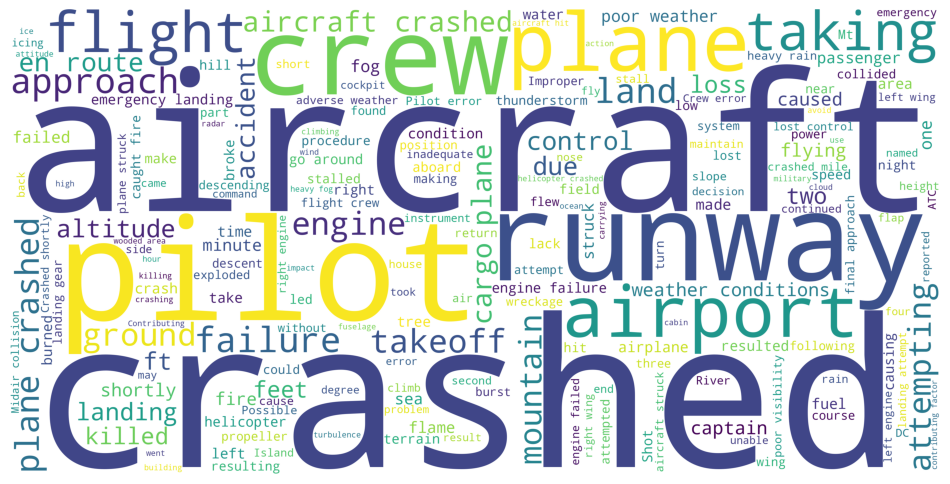

In [84]:
import nltk
nltk.download('stopwords')


# Make sure 'summary' is a string type
df['summary'] = df['summary'].astype('str')

# Concatenate all summaries into a single text string
text = ' '.join(df['summary'])

# Create the word cloud
stop = stopwords.words('english')
overview_wordcloud = WordCloud(stopwords=stop, background_color='white', height=2000, width=4000).generate(text)

# Plot
plt.figure(figsize=(12, 8))
plt.imshow(overview_wordcloud)
plt.axis('off')
plt.show()


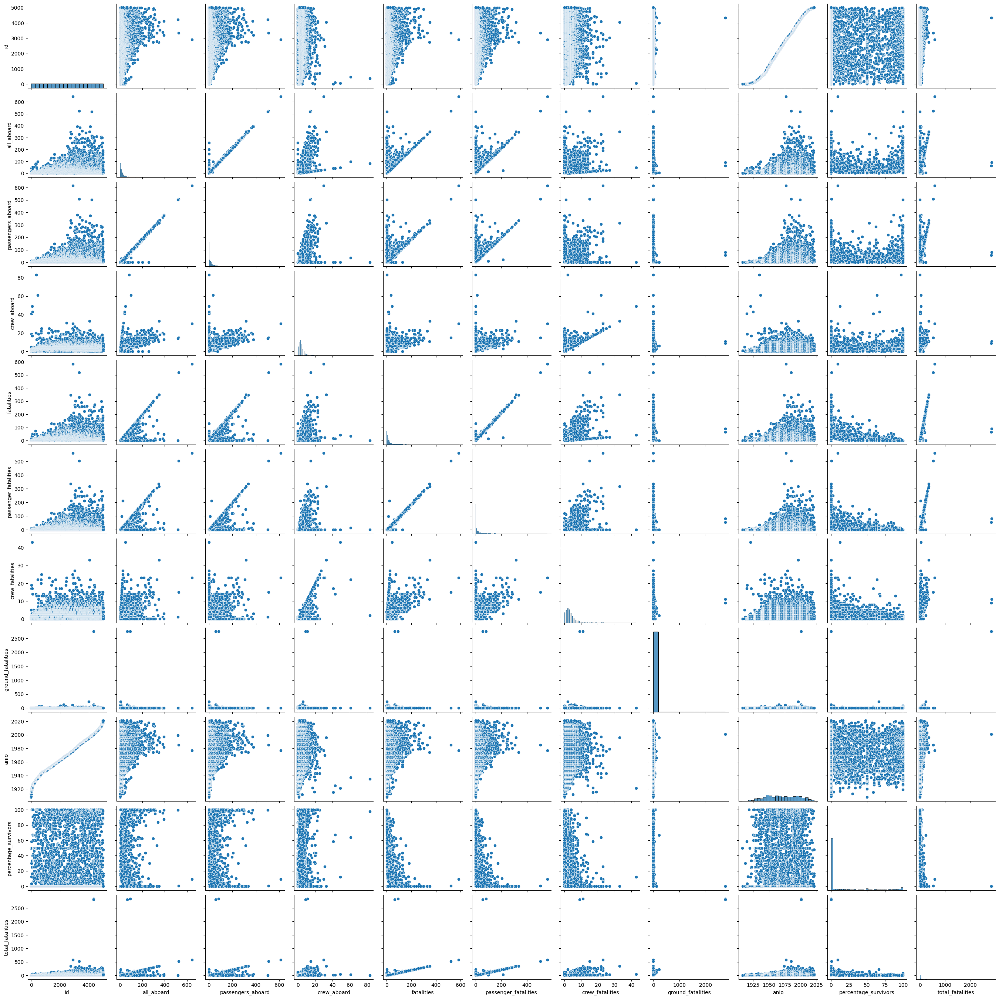

In [85]:
# We create a pairplot to understand the relationship between the variables
sns.pairplot(data=df)

<Figure size 400x400 with 0 Axes>

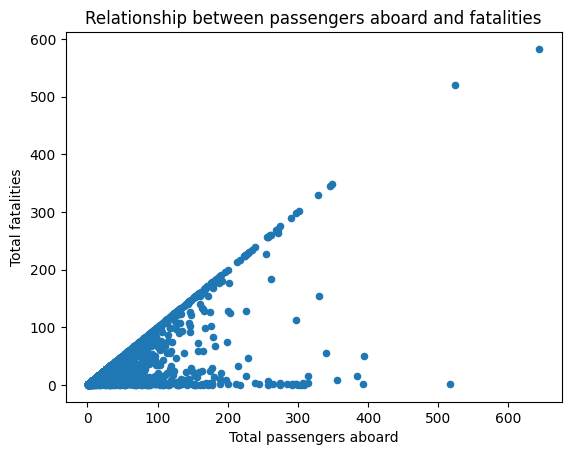

In [86]:
plt.figure(figsize=(4,4))
df.plot(x="all_aboard", y="fatalities", kind="scatter", color='tab:blue')
plt.xlabel("Total passengers aboard")
plt.ylabel("Total fatalities")
plt.title("Relationship between passengers aboard and fatalities")

plt.show()


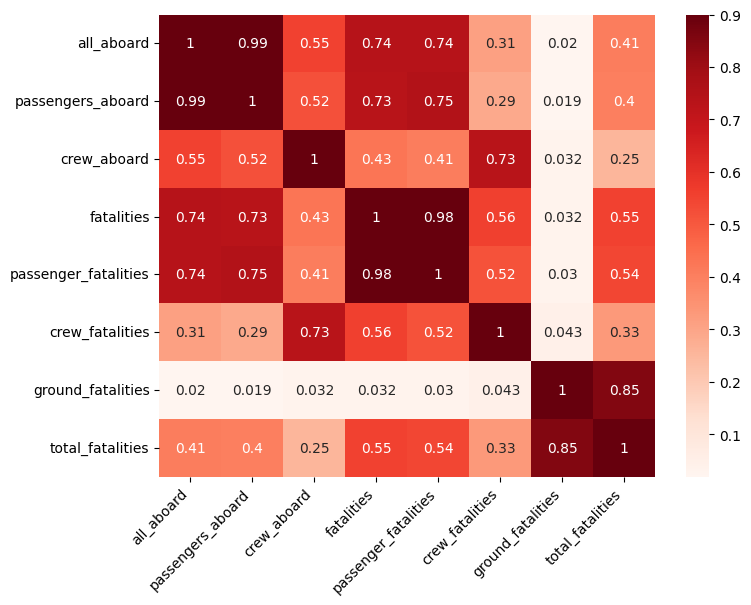

In [87]:
corr = df[['all_aboard', 'passengers_aboard', 'crew_aboard', 'fatalities', 'passenger_fatalities', 'crew_fatalities', 'ground_fatalities', 'total_fatalities']].corr()
plt.subplots(figsize=(8,6))
heatmap = sns.heatmap(corr, annot=True, vmax=0.9, cmap="Reds")
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=45, horizontalalignment='right')

plt.show()


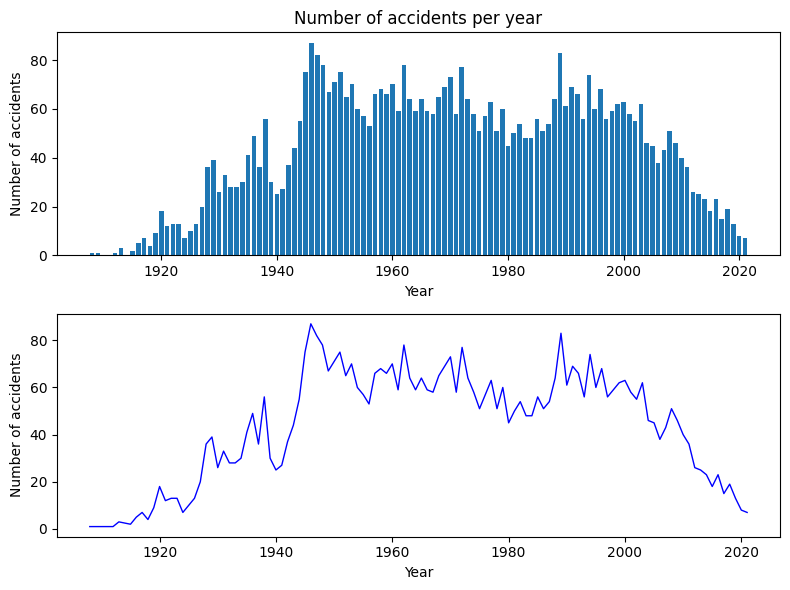

In [89]:
# Count the number of accidents per year
accidents_per_year = df['anio'].value_counts().sort_index()

# Create the figure and subplots
fig, axs = plt.subplots(2, 1, figsize=(8, 6))

# Plot 1: Number of accidents per year (bar plot)
axs[0].bar(accidents_per_year.index, accidents_per_year.values, color='tab:blue')
axs[0].set_title('Number of accidents per year')
axs[0].set_xlabel('Year')
axs[0].set_ylabel('Number of accidents')

# Plot 2: Accidents per year (line plot)
sns.lineplot(x=accidents_per_year.index, y=accidents_per_year.values, color='blue', linewidth=1, ax=axs[1])
axs[1].set_xlabel('Year')
axs[1].set_ylabel('Number of accidents')

# Adjust spacing between subplots
plt.tight_layout()

plt.show()


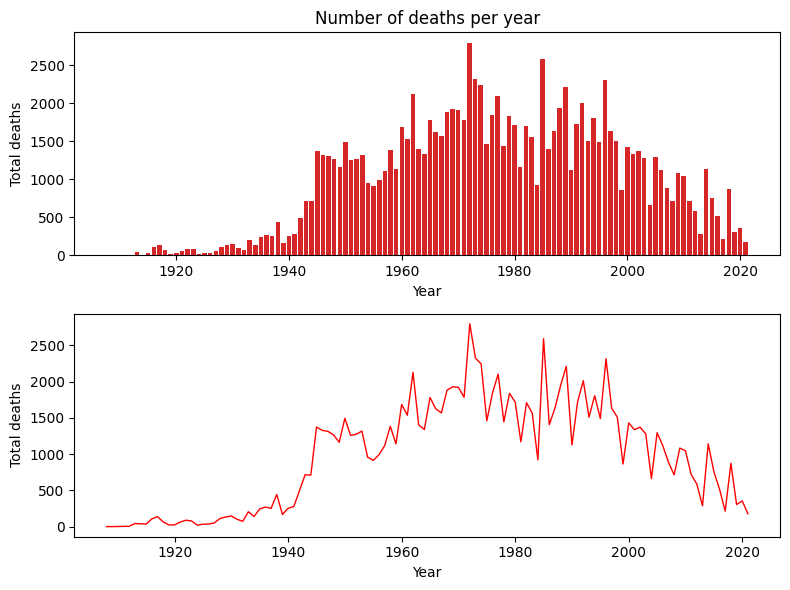

In [90]:
# Count deaths per year
deaths_per_year = df.groupby('anio')['fatalities'].agg(['sum', 'count'])

# Create the figure and subplots
fig, axs = plt.subplots(2, 1, figsize=(8, 6))

# Plot 1: Total deaths per year (bar plot)
axs[0].bar(deaths_per_year.index, deaths_per_year['sum'], color='tab:red')
axs[0].set_xlabel('Year')
axs[0].set_ylabel('Total deaths')
axs[0].set_title('Number of deaths per year')

# Plot 2: Number of deaths per year (line plot)
axs[1].plot(deaths_per_year.index, deaths_per_year['sum'], linewidth=1, color='red')
axs[1].set_xlabel('Year')
axs[1].set_ylabel('Total deaths')

# Adjust spacing between subplots
plt.tight_layout()

plt.show()


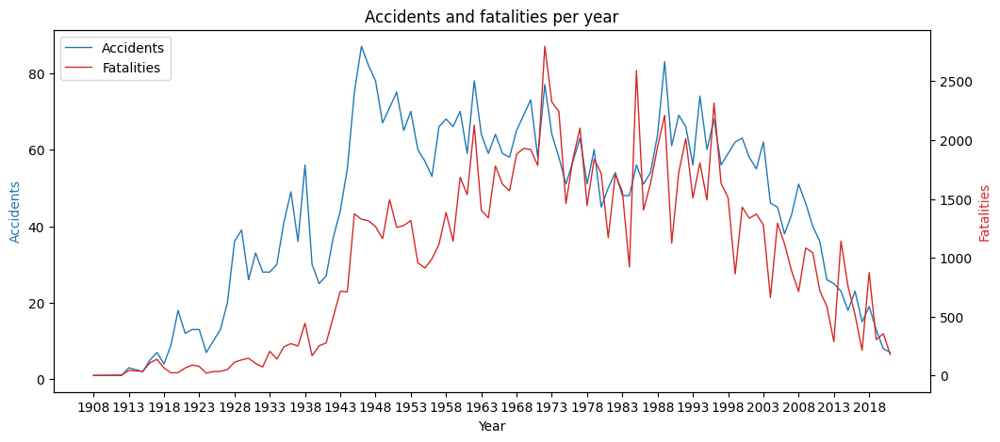

In [91]:
# Create figure and axes
fig, ax1 = plt.subplots(figsize=(12, 5))

# Plot crashes on left y-axis
ax1.plot(accidents_per_year.index, accidents_per_year.values, linewidth=1, label='Accidents')
ax1.set_xlabel('Year')
ax1.set_ylabel('Accidents', color='tab:blue')
ax1.set_title('Accidents and fatalities per year')

# Create a second y-axis for total fatalities
ax2 = ax1.twinx()

# Plot total fatalities on right y-axis with triangle marker
ax2.plot(deaths_per_year.index, deaths_per_year['sum'], linewidth=1, color='tab:red', label='Fatalities')
ax2.set_ylabel('Fatalities', color='tab:red')

# Combine the legends
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc='upper left')

# Set x-axis tick locations and labels
years = np.arange(accidents_per_year.index.min(), accidents_per_year.index.max() + 1, 5)
ax1.set_xticks(years)

plt.show()


## *With the development of commercial aviation, we can observe the first increase in accidents and fatalities from around 1914. It makes sense that as more flights are conducted, the number of accidents would increase. The period between 1918 and 1939 is known as the 'Golden Age of Aviation' because technology was heavily developed during this time, leading to numerous advancements. This captivated the world and increased fascination with aviation, resulting in an increase in flight numbers and, consequently, accidents. However, the mortality rate during these years was low, as flights were mostly conducted without passengers. In the graph, we see a dramatic increase in accidents after 1940, which coincides with World War II and the subsequent increase in flight numbers and advancements made in aviation during the war. Numerous aircraft were built for military purposes during this time and later repurposed for commercial or transportation use. With the end of the war, commercial aviation separated from military aviation and began to grow. We can observe a decrease in the number of accidents and fatalities since the 1990s, possibly due to improvements in safety, technology, and training.*

In [93]:
fatalities_per_year = df.groupby('anio')['fatalities'].sum()

year_with_most_fatalities = fatalities_per_year.idxmax()

print("Year with the highest number of fatalities:", year_with_most_fatalities)

Year with the highest number of fatalities: 1972


<ipython-input-99-fc1d1406e766>:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='survivors', palette=['tab:green', 'tab:red'], ax=axs[1])


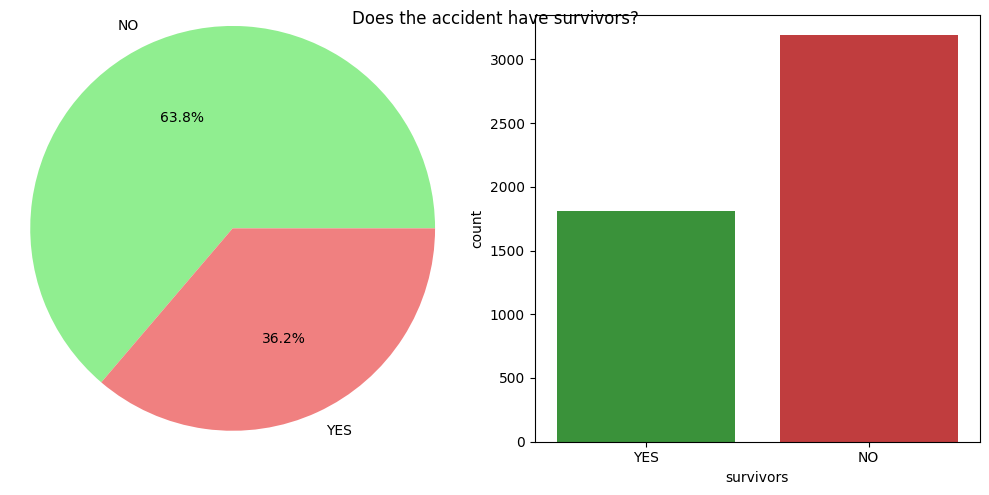

In [99]:
# Define the colors for the pie chart
colors = ['lightgreen', 'lightcoral']

# Obtain the count of 'YES' and 'NO' values in the 'sobrevivientes' column
survivors_count = df['survivors'].value_counts()

# Create a figure and a subplot grid with 1 row and 2 columns
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Plot 1: Pie chart of survivors
axs[0].pie(survivors_count, labels=survivors_count.index, autopct='%1.1f%%', colors=colors)
axs[0].axis('equal')

# Plot 2: Bar plot of accidents with and without survivors
sns.countplot(data=df, x='survivors', palette=['tab:green', 'tab:red'], ax=axs[1])

# Adjust spacing between subplots
plt.tight_layout()
fig.suptitle('Does the accident have survivors?')

# Show the figure
plt.show()



<ipython-input-100-0a3bdf8570d3>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=df_top_10.index, x="fatalities", data=df_top_10, palette="rocket" )


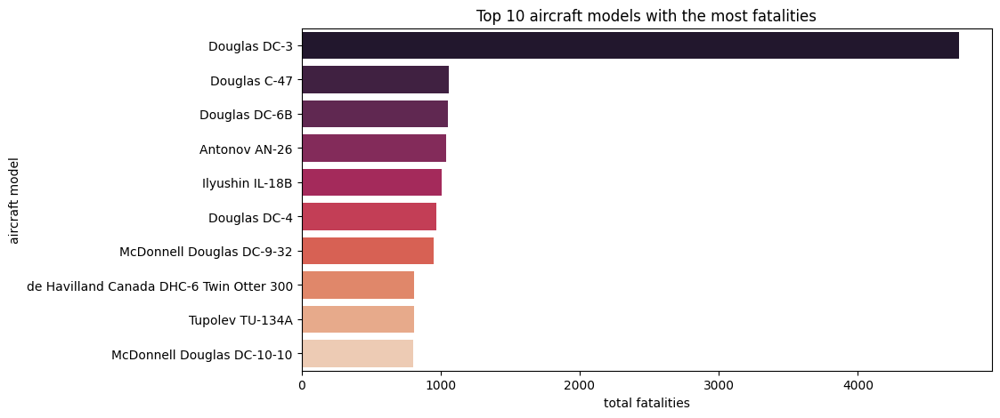

In [100]:
# See which aircraft has the highest number of deaths
df_fatal = df.groupby('ac_type')[['fatalities']].sum()
df_fatal = df_fatal.sort_values(by='fatalities', ascending=False)

df_top_10 = df_fatal.nlargest(10, 'fatalities')

plt.figure(figsize=(10, 5))
sns.barplot(y=df_top_10.index, x="fatalities", data=df_top_10, palette="rocket" )
plt.xlabel('total fatalities')
plt.ylabel('aircraft model')
plt.title('Top 10 aircraft models with the most fatalities')
plt.show()


## *Now we know that the DOUGLAS DC-3 far exceeds any other aircraft in number of deaths, but I want to see if the number of accidents is representative or not.*

In [101]:
accidents_by_type = df['ac_type'].value_counts()
accidents_by_type


ac_type
Douglas DC-3                                333
de Havilland Canada DHC-6 Twin Otter 300     81
Douglas C-47A                                70
Douglas C-47                                 63
Douglas DC-4                                 41
                                           ... 
Convair CV-340-59                             1
Vickers Viscount 759D                         1
H-21B                                         1
Avro 685 York C1                              1
Antonov An 26B-100                            1
Name: count, Length: 2466, dtype: int64

## *With this data I see that although the 'de Havilland Canada DHC-6 Twin Otter 300' had fewer fatalities than the 'Douglas C-47' it had many more accidents, so I am going to compare the 3 with the highest accidents over the years. years to evaluate their performance*

In [105]:
df.head()

,id,fecha,hora,locacion,operator,ac_type,all_aboard,passengers_aboard,crew_aboard,fatalities,passenger_fatalities,crew_fatalities,ground_fatalities,summary,anio,survivors,percentage_survivors,total_fatalities
0,0,1908-09-17,17:18,"Fort Myer, Virginia",Military - U.S. Army,Wright Flyer III,2.0,1.0,1.0,1.0,1.0,0.0,0.0,"During a demonstration flight, a U.S. Army fly...",1908,YES,50.0,1.0
1,1,1909-09-07,00:00,"Juvisy-sur-Orge, France",desconocido,Wright Byplane,1.0,0.0,1.0,1.0,0.0,0.0,0.0,Eugene Lefebvre was the first pilot to ever be...,1909,NO,0.0,1.0
2,2,1912-07-12,06:30,"Atlantic City, New Jersey",Military - U.S. Navy,Dirigible,5.0,0.0,5.0,5.0,0.0,5.0,0.0,First U.S. dirigible Akron exploded just offsh...,1912,NO,0.0,5.0
3,3,1913-08-06,00:00,"Victoria, British Columbia, Canada",Private,Curtiss seaplane,1.0,0.0,1.0,1.0,0.0,1.0,0.0,The first fatal airplane accident in Canada oc...,1913,NO,0.0,1.0
4,4,1913-09-09,18:30,Over the North Sea,Military - German Navy,Zeppelin L-1 (airship),20.0,0.0,0.0,14.0,0.0,0.0,0.0,The airship flew into a thunderstorm and encou...,1913,YES,30.0,14.0


In [106]:
# Select the aircraft types with the most crashes
top_3_types = accidentes_por_tipo.nlargest(3).index

# Define los colores para cada aeronave
colors = ['tab:blue', 'tab:orange', 'tab:green']

# Set up the figure and axes
fig, ax = plt.subplots(figsize=(12, 6))

# Iterate over the top 3 aircraft types
for i, aircraft_type in enumerate(top_3_types):
    # Filter the DataFrame for the selected aircraft type
    type_data = df[df['ac_type'] == aircraft_type].copy()

    # Group the data by year and calculate the count of crashes for each year
    crashes_by_year = type_data.groupby('anio').size()

    # Plot the number of crashes over the years
    ax.plot(crashes_by_year.index, crashes_by_year.values, linewidth=1, color=colors[i], label=aircraft_type)

# Set the labels and title
ax.set_xlabel('año')
ax.set_ylabel('cantidad de accidentes')
ax.set_title('accidentes de las tres aeronaves más comunes a lo largo de los años')

# Rotate the x-axis labels for better readability
for label in ax.xaxis.get_ticklabels():
    label.set_rotation(45)

# Add a legend
ax.legend()

# Display the plot
plt.show()


NameError: name 'accidentes_por_tipo' is not defined

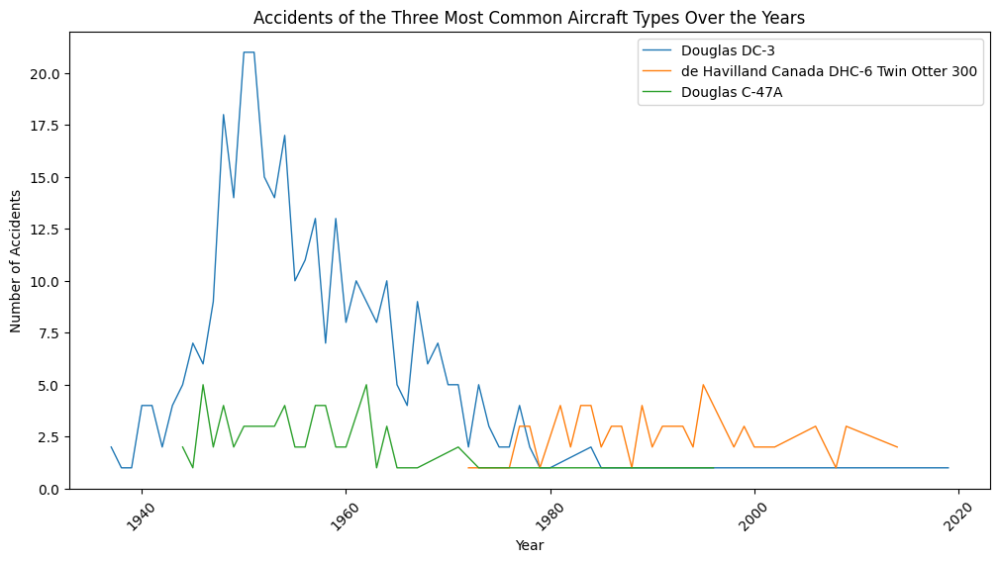

In [108]:
# Select the aircraft types with the most crashes
top_3_types = df['ac_type'].value_counts().nlargest(3).index

# Define the colors for each aircraft
colors = ['tab:blue', 'tab:orange', 'tab:green']

# Set up the figure and axes
fig, ax = plt.subplots(figsize=(12, 6))

# Iterate over the top 3 aircraft types
for i, aircraft_type in enumerate(top_3_types):
    # Filter the DataFrame for the selected aircraft type
    type_data = df[df['ac_type'] == aircraft_type].copy()

    # Group the data by year and calculate the count of crashes for each year
    crashes_by_year = type_data.groupby('anio').size()

    # Plot the number of crashes over the years
    ax.plot(crashes_by_year.index, crashes_by_year.values, linewidth=1, color=colors[i], label=aircraft_type)

# Set the labels and title
ax.set_xlabel('Year')
ax.set_ylabel('Number of Accidents')
ax.set_title('Accidents of the Three Most Common Aircraft Types Over the Years')

# Rotate the x-axis labels for better readability
for label in ax.xaxis.get_ticklabels():
    label.set_rotation(45)

# Add a legend
ax.legend()

# Display the plot
plt.show()


## *After* conducting a thorough analysis, it's evident that the DOUGLAS DC-3 aircraft, which saw extensive service post-World War II, gradually became outdated around the 1980s. This decline coincided with advancements in aviation technology. Conversely, the introduction of the de Havilland Canada DHC-6 Twin Otter 300 marked a new era, despite its notable accident record. Although its accident frequency is comparable to the DOUGLAS C-47A, it pales in comparison to the staggering number of incidents associated with the DOUGLAS DC-3. Without specific flight data, it's challenging to assess performance accurately. However, the significantly higher accident rate of the DOUGLAS DC-3 suggests it may no longer be a viable option for contemporary aviation needs. *italicized text*

<ipython-input-109-baf4d8ed2523>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=df_death_airline_top10.index, x='total_fatalities', data=df_death_airline_top10, palette="magma")


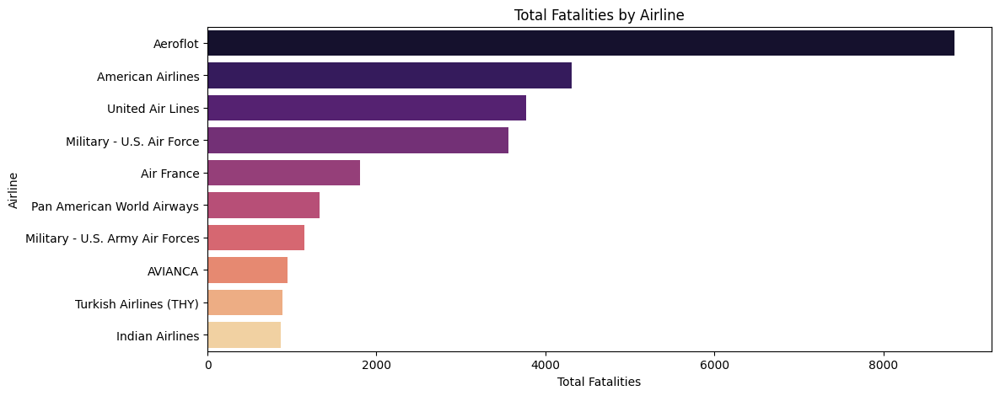

In [109]:
# Let's visualize the top 10 airlines or operators with the most fatalities
df_death_airline = df.groupby('operator')[['total_fatalities']].sum()
df_death_airline = df_death_airline.sort_values(by='total_fatalities', ascending=False)
df_death_airline_top10 = df_death_airline.head(10)

plt.figure(figsize=(12, 5))
sns.barplot(y=df_death_airline_top10.index, x='total_fatalities', data=df_death_airline_top10, palette="magma")
plt.xlabel('Total Fatalities')
plt.ylabel('Airline')
plt.title('Total Fatalities by Airline')
plt.show()


### *The big difference between Aeroflot and the rest of the airlines is striking; its fatalities even double those of the armed forces. Aeroflot is a Russian airline, so we are going to investigate the locations of the accidents to see if there is some kind of relationship.*

<ipython-input-114-88a4923d0e9f>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y='location', x='accidents', data=df_location_top_10, palette="viridis")


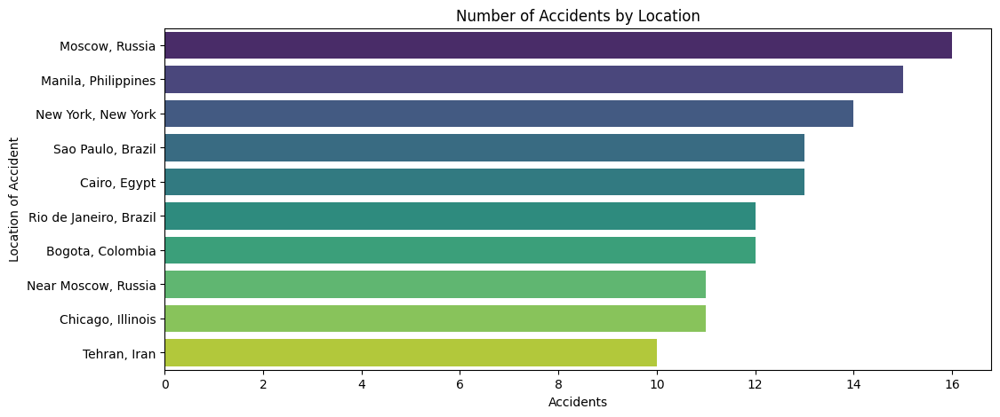

In [114]:
# Now, let's visualize where the majority of accidents occurred
df_location_top_10 = df['locacion'].value_counts().head(10)
df_location_top_10 = df_location_top_10.reset_index()  # Reset the index
df_location_top_10.columns = ['location', 'accidents']  # Rename columns for clarity

plt.figure(figsize=(12, 5))
sns.barplot(y='location', x='accidents', data=df_location_top_10, palette="viridis")
plt.xlabel('Accidents')
plt.ylabel('Location of Accident')
plt.title('Number of Accidents by Location')
plt.show()



## *Although it coincides with the place where the most accidents are recorded, not by much. Now what I want is to have an approach to the number of accidents with respect to the month and day of the week.*

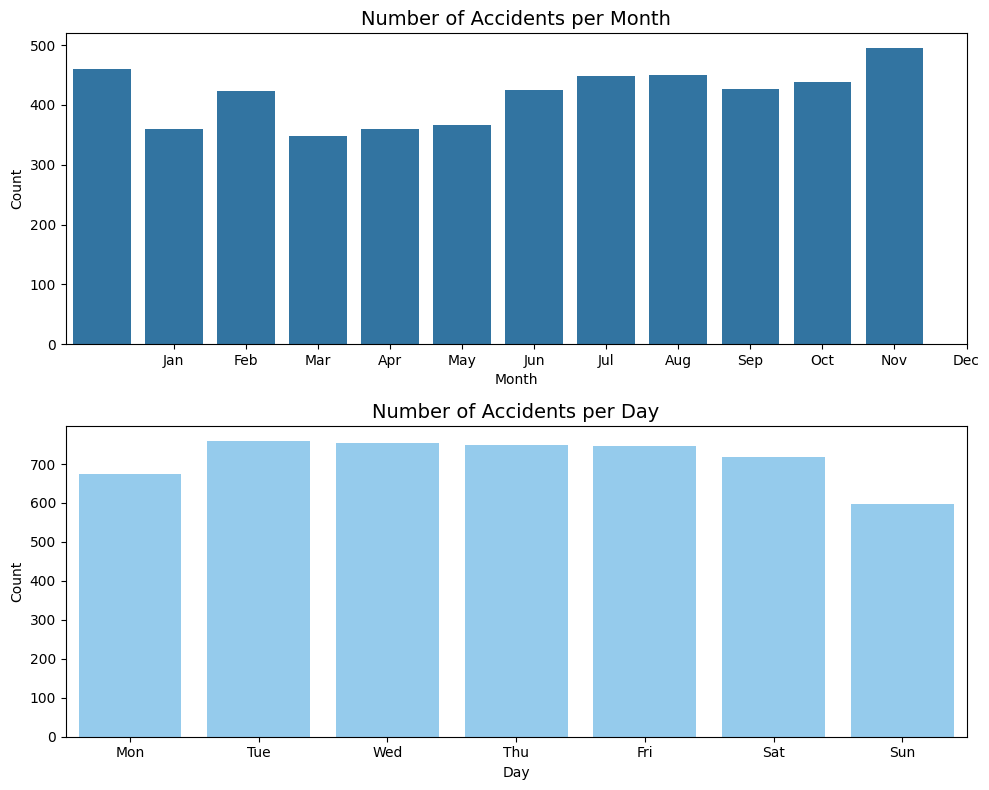

In [115]:
gs = gridspec.GridSpec(2, 2)
plt.figure(figsize=(10,8))

ax = plt.subplot(gs[0, :]) # row 0, span all columns
sns.barplot(x=df.groupby(df.fecha.dt.month)[['fecha']].count().index, y=df.groupby(df.fecha.dt.month)[['fecha']].count()['fecha'], color='tab:blue')
plt.xticks(df.groupby(df.fecha.dt.month)[['fecha']].count().index, ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.xlabel('Month', fontsize=10)
plt.ylabel('Count', fontsize=10)
plt.title('Number of Accidents per Month', loc='Center', fontsize=14)

ax = plt.subplot(gs[1, :]) # row 1, span all columns
sns.barplot(x=df.groupby(df.fecha.dt.weekday)[['fecha']].count().index, y=df.groupby(df.fecha.dt.weekday)[['fecha']].count()['fecha'], color='lightskyblue')
plt.xticks(df.groupby(df.fecha.dt.weekday)[['fecha']].count().index, ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
plt.xlabel('Day', fontsize=10)
plt.ylabel('Count', fontsize=10)
plt.title('Number of Accidents per Day', loc='Center', fontsize=14)

plt.tight_layout()
plt.show()

## *We can see that in the months of November and December there are usually more accidents, but of course there are also usually more flights since it coincides with the holidays that are celebrated internationally and vacations.*

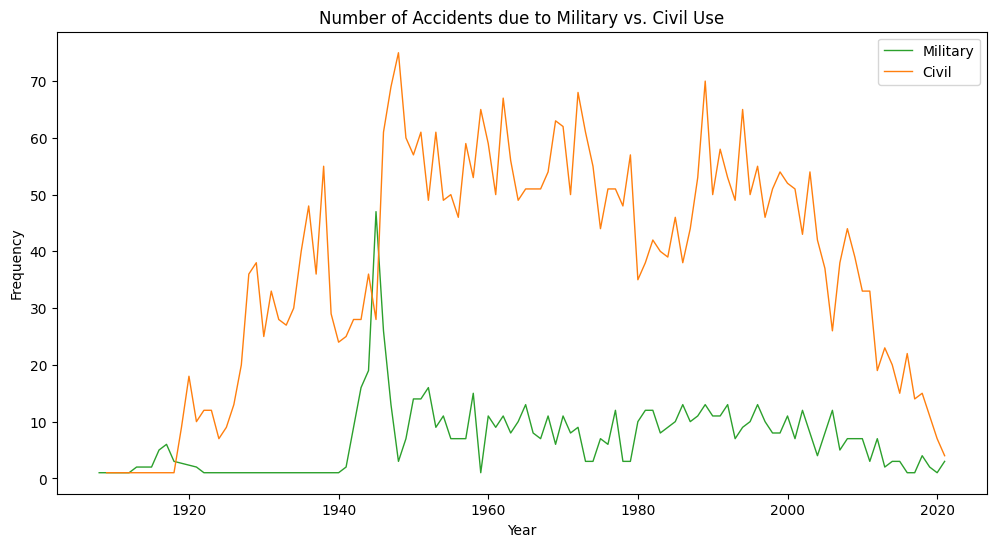

In [126]:
plt.figure(figsize=(12, 6))
sns.lineplot(data=total_militar, x='frecuencia', y='count', linewidth=1, color='tab:green', label='Military')
sns.lineplot(data=total_civil, x='frecuencia', y='count', linewidth=1, color='tab:orange', label='Civil')
plt.xlabel('Year')
plt.ylabel('Frequency')
plt.title('Number of Accidents due to Military vs. Civil Use', loc='Center', fontsize=12)
plt.legend()
plt.show()


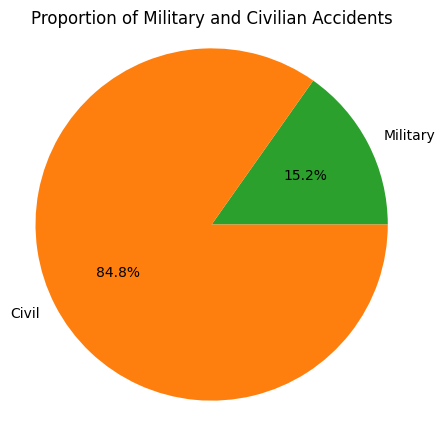

In [130]:
# Calculate the total sum of military and civilian accidents
total_accidents_military = total_militar['count'].sum()
total_accidents_civil = total_civil['count'].sum()
data = [total_accidents_military, total_accidents_civil]

labels = ['Military', 'Civil']
colors = ['tab:green', 'tab:orange']

plt.figure(figsize=(5, 5))  # Pie chart
plt.pie(data, labels=labels, colors=colors, autopct='%1.1f%%')
plt.title('Proportion of Military and Civilian Accidents')
plt.axis('equal')  # To make the chart circular

plt.show()



## *Military accidents are very low in relation to passenger accidents with one exception coinciding with World War II, which makes a lot of sense.*

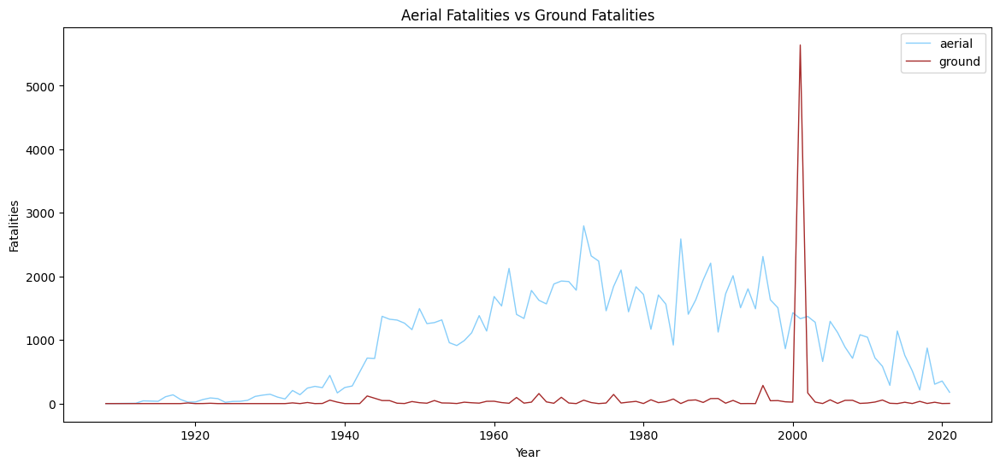

In [132]:
aerial_year = df.groupby('anio')['fatalities'].sum().reset_index()
ground_year = df.groupby('anio')['ground_fatalities'].sum().reset_index()
plt.figure(figsize=(14, 6))
sns.lineplot(data=aerial_year, x='anio', y='fatalities', linewidth=1, color='lightskyblue', label='aerial')
sns.lineplot(data=ground_year, x='anio', y='ground_fatalities', linewidth=1, color='brown', label='ground')
plt.xlabel('Year')
plt.ylabel('Fatalities')
plt.title('Aerial Fatalities vs Ground Fatalities', loc='Center', fontsize=12)
plt.legend()
plt.show()


## *We see that there is a super high peak in 2001, we know that it is the year where the Twin Towers fell in the USA, we are going to look for that data to corroborate:*

In [133]:
df[df['ground_fatalities']>1000]

,id,fecha,hora,locacion,operator,ac_type,all_aboard,passengers_aboard,crew_aboard,fatalities,passenger_fatalities,crew_fatalities,ground_fatalities,summary,anio,survivors,percentage_survivors,total_fatalities
4346,4346,2001-09-11,08:47,"New York City, New York",American Airlines,Boeing 767-223ER,92.0,81.0,11.0,92.0,81.0,11.0,2750.0,The aircraft was hijacked shortly after it lef...,2001,NO,0.0,2842.0
4347,4347,2001-09-11,09:03,"New York City, New York",United Air Lines,Boeing B-767-222,65.0,56.0,9.0,65.0,56.0,9.0,2750.0,The aircraft was hijacked shortly after it lef...,2001,NO,0.0,2815.0


In [134]:
df[df['fatalities']>500]

,id,fecha,hora,locacion,operator,ac_type,all_aboard,passengers_aboard,crew_aboard,fatalities,passenger_fatalities,crew_fatalities,ground_fatalities,summary,anio,survivors,percentage_survivors,total_fatalities
2902,2902,1977-03-27,17:07,"Tenerife, Canary Islands",Pan American World Airways / KLM,Boeing B-747-121 / Boeing B-747-206B,644.0,614.0,30.0,583.0,560.0,23.0,0.0,Both aircraft were diverted to Tenerife becaus...,1977,YES,9.472050,583.0
3341,3341,1985-08-12,18:56,"Mt. Osutaka, near Ueno Village, Japan",Japan Air Lines,Boeing B-747-SR46,524.0,509.0,15.0,520.0,505.0,15.0,0.0,The aircraft suffered an aft pressure bulkhead...,1985,YES,0.763359,520.0
